# Обробка зображень та робота з наборами файлів цифрових зображень
**Мета:** отримати знання та навики в обробці цифрових зображень за
допомогою бібліотек Pillow та/або OpenCV та роботі з обробки набору
зображень.

1. Створити функцію, що в якості аргумента приймає адресу папки на диску
та повертає датафрейм з наступною інформацією про зображення, що 
знаходяться в папці:
- ім’я файлу;
- кольорову модель;
- формат;
- кількість каналів у зображенні;
- розмір файлу у мегабайтах байтах, округлених до двох знаків після 
коми;
- ширину картинки;
- висоту картинки;
- повний шлях до файлу;
- зменшене зображення.

In [1]:
from PIL import Image, UnidentifiedImageError
from IPython.display import display, HTML
import glob
import os
import pandas as pd

def to_dataframe(path):
  data = []
  image_files = glob.glob(os.path.join(path, '*.*')) # jpeg, png, jpg, avif, mhtml
  for file in image_files:
        try:
          img = Image.open(file)
          width, height = img.size
          size_mb = round(os.path.getsize(file) / (1024 * 1024), 2)
          filename = os.path.basename(file)
          if 'horses.jpg' == filename or 'grey_dog.jpg' == filename:
            img = img.convert('L')
          if 'dog.png' == filename:
            img = img.convert('RGBA')
          data.append({
            'Name': filename,
            'Color Model': img.mode,
            'Format': img.format,
            'Channels': len(img.getbands()),
            'Size': size_mb,
            'Width': width,
            'Height': height,
            'Full Path': os.path.abspath(file),
            'image': os.path.abspath(file)
          })
        except UnidentifiedImageError:
            print(f"Couldn't process file {file}: Not a valid image format.")
  df = pd.DataFrame(data)
  return df

Couldn't process file C:\Images\cookies.avif: Not a valid image format.
Couldn't process file C:\Images\pianist.mhtml: Not a valid image format.


,Name,Color Model,Format,Channels,Size,Width,Height,Full Path,image
0,autumn-park.jpg,RGB,JPEG,3,0.11,600,600,C:\Images\autumn-park.jpg,
1,cat.jpg,RGB,JPEG,3,0.07,736,1308,C:\Images\cat.jpg,
2,dog-gea02d8c03_1280.jpg,RGB,JPEG,3,0.29,1280,911,C:\Images\dog-gea02d8c03_1280.jpg,
3,dog.png,RGBA,None,4,1.10,1280,853,C:\Images\dog.png,
4,ghosts.jpg,RGB,JPEG,3,0.13,736,1313,C:\Images\ghosts.jpg,
5,grey_dog.jpg,L,None,1,0.09,1200,800,C:\Images\grey_dog.jpg,
6,hedgehog.jpg,RGB,JPEG,3,0.12,673,1200,C:\Images\hedgehog.jpg,
7,horses.jpg,L,None,1,0.15,1280,848,C:\Images\horses.jpg,
8,last_img.png,RGB,PNG,3,0.67,528,700,C:\Images\last_img.png,
9,monday.jpg,RGB,JPEG,3,0.12,736,736,C:\Images\monday.jpg,

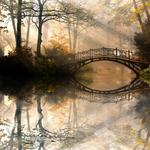
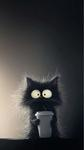
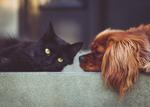
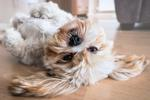
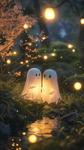
...
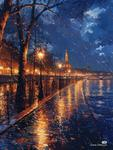
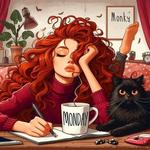
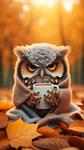
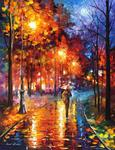
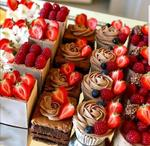

In [2]:
import base64
from io import BytesIO

def get_thumbnail(path):
    i = Image.open(path)
    i.thumbnail((150, 150), Image.LANCZOS)
    return i

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

df = to_dataframe('C:\Images')
HTML(df.to_html(formatters={'image': image_formatter}, escape=False))

2. Створити функцію, що в якості аргумента приймає:
- шлях до папки;
- назва вихідного зображення;
- кількість зображень в рядку;
- кількість зображень в стовпчику
і повертає зображення постера.

In [3]:
import random

def to_square(file):
  img = Image.open(file)
  width, height = img.size
  new_size = min(width, height)
  left = (width - new_size) // 2
  top = (height - new_size) // 2
  right = (width + new_size) // 2
  bottom = (height + new_size) // 2
  return img.crop((left, top, right, bottom))

def apply_filter(img, filter):
  r, g, b = img.split()
  colors = {
    'red': (225, 0, 0),
    'green': (0, 225, 0),
    'blue': (0, 0, 255),
    'yellow': (255, 255, 0),
    'purple': (255, 0, 255),
    'cyan': (0, 255, 255)
  }
  r_value, g_value, b_value = colors.get(filter, (0, 0, 0))
  r = r.point(lambda x: min(255, int(x * (r_value / 255))))
  g = g.point(lambda x: min(255, int(x * (g_value / 255))))
  b = b.point(lambda x: min(255, int(x * (b_value / 255))))
  return Image.merge('RGB', (r, g, b))

def to_poster(path, filename, columns, rows):
  square_images = []
  image_files = glob.glob(os.path.join(path, '*.png')) + \
                  glob.glob(os.path.join(path, '*.jpg')) + \
                    glob.glob(os.path.join(path, '*.jpeg'))
  for file in image_files:
      new_img = to_square(file)
      new_size = (500, 500)
      new_img = new_img.resize(new_size)
      square_images.append(new_img)
  images = []
  for row in range(rows+1):
    for column in range(columns+1):
      img = random.choice(square_images)
      color_filter = random.choice(['red', 'green', 'blue', 'yellow', 'purple', 'cyan'])
      img = img.convert('RGB')
      image_with_filter = apply_filter(img, color_filter)
      images.append(image_with_filter)

  poster = Image.new(images[0].mode,(images[0].width * columns,
                                      images[0].height * rows))
  x = 0
  y = 0
  for img in images[1:]:
      poster.paste(img, (x,y))
      if x + images[0].width == poster.width:
          x = 0
          y = y + images[0].height
      else:
          x = x + images[0].width
  poster.save(filename)
  return poster

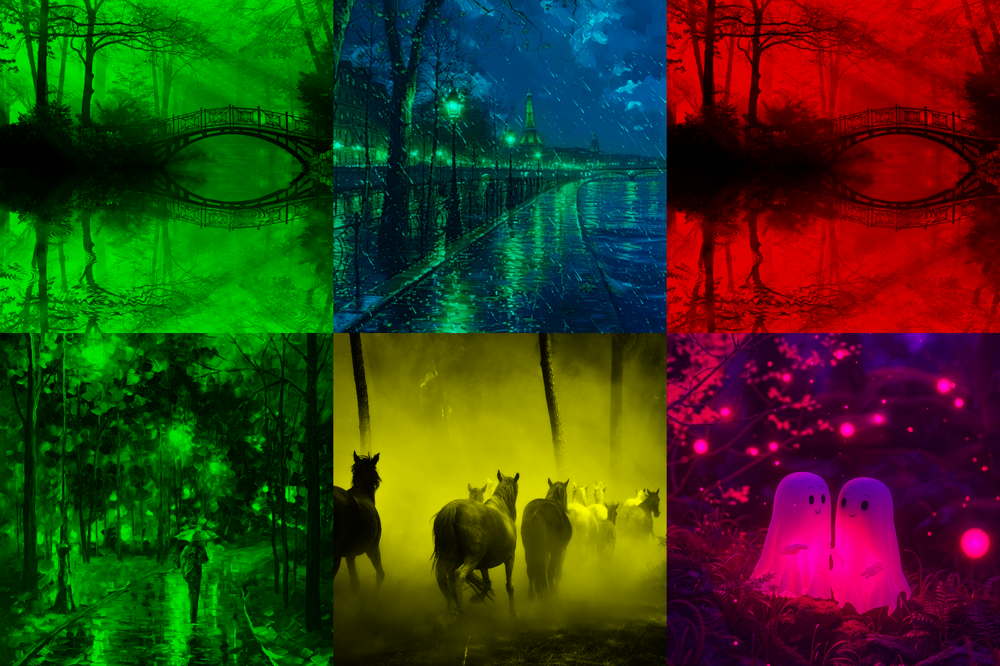

In [5]:
poster = to_poster('C:\Images', 'poster_3x2.png', 3, 2)
poster

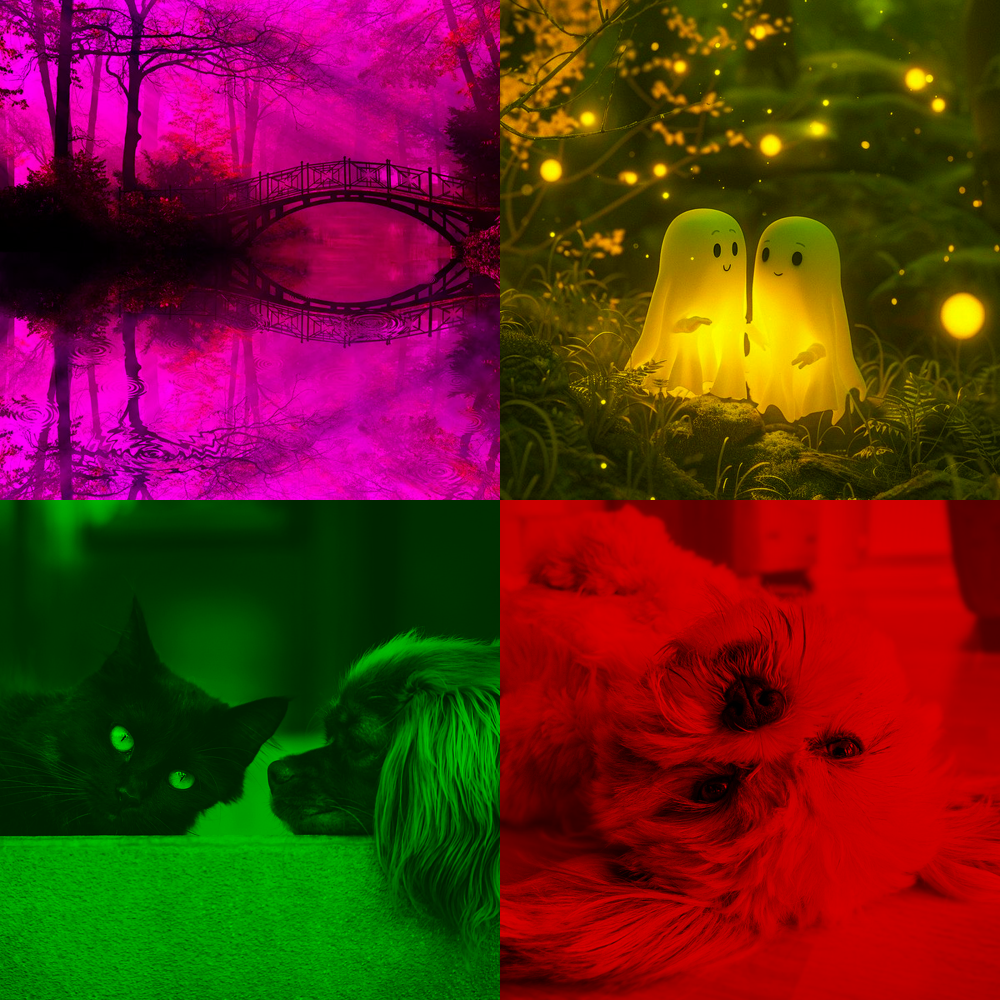

In [6]:
poster = to_poster('C:\Images', 'poster_2x2.png', 2, 2)
poster

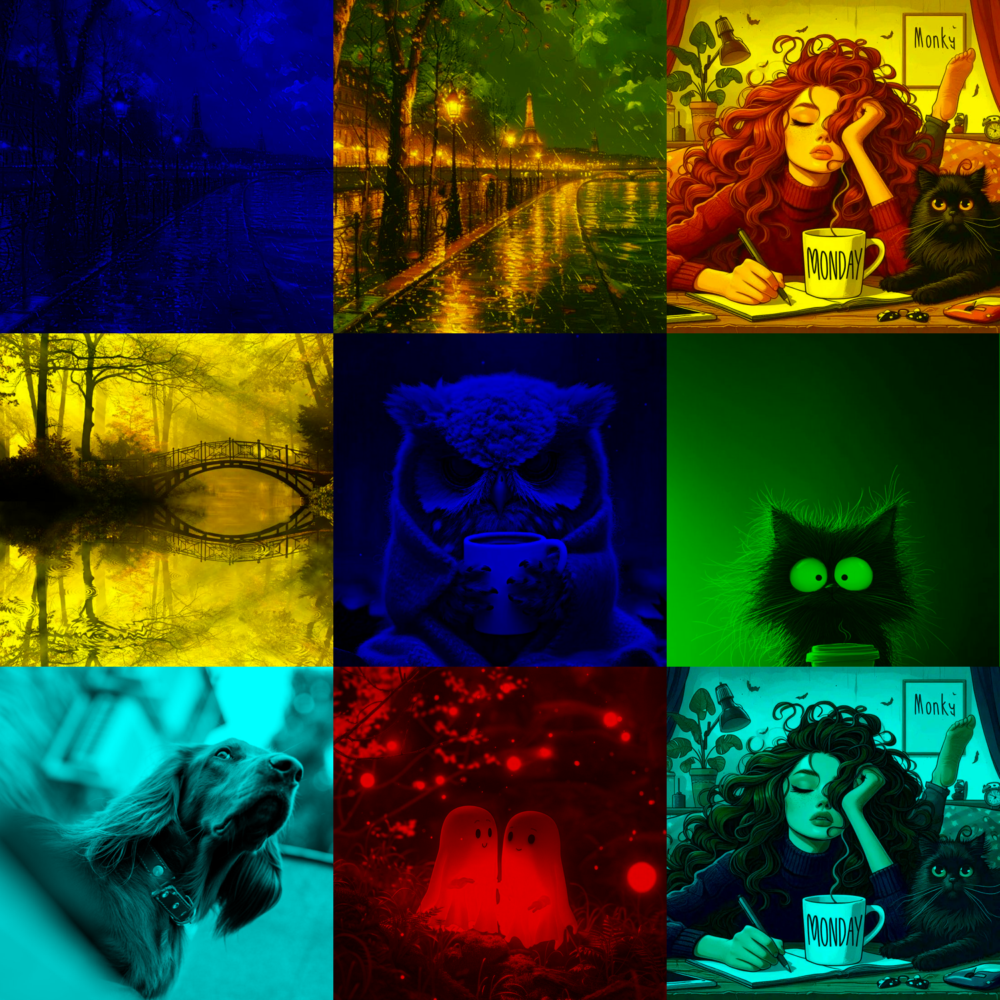

In [7]:
poster = to_poster('C:\Images', 'poster_3x3.png', 3, 3)
poster

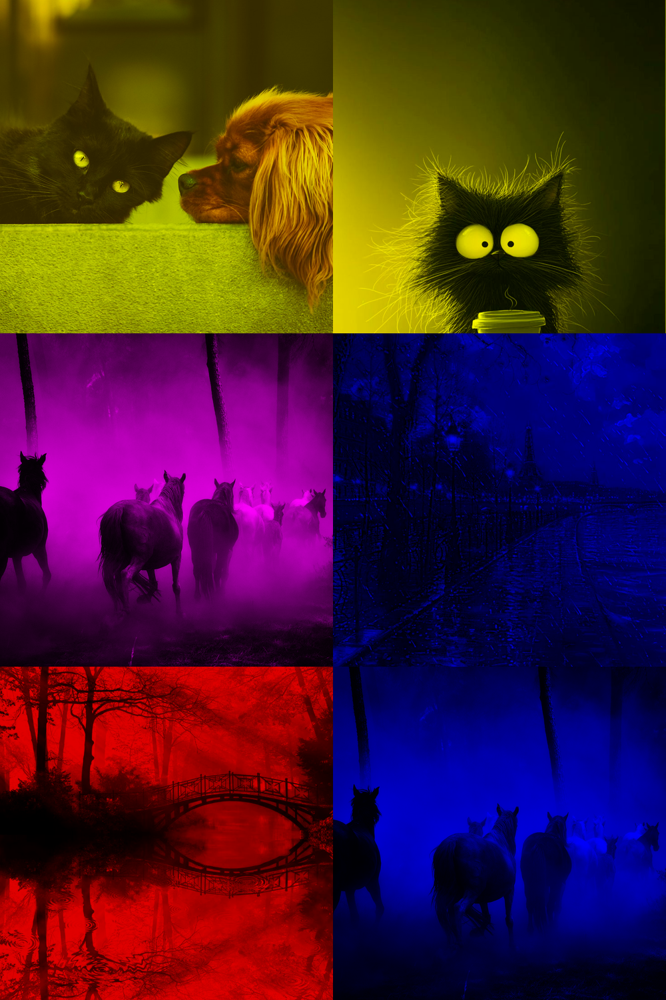

In [8]:
poster = to_poster('C:\Images', 'poster_2x3.png', 2, 3)
poster